# Project Name: Training Models with Different Optimizers: Comparative Analysis of SGD, Adam, and RMSprop

**Overview:**
This educational project introduces students to optimization techniques in machine learning model training. Students will train a simple neural network model using popular optimizers—Stochastic Gradient Descent (SGD), Adam, and RMSprop—and analyze the effects of each optimizer on model performance and training behavior.

**You have:**
* A suitable dataset (e.g., MNIST or Fashion-MNIST) for straightforward neural network training.
* Basic proficiency in Python, TensorFlow or PyTorch, NumPy, and matplotlib for visualization.

**We will:**
1. Construct a simple neural network architecture for classification tasks.
2. Train the model separately using each optimizer (SGD, Adam, RMSprop), keeping other training parameters constant for a fair comparison.
3. Evaluate and visualize training performance by comparing metrics such as accuracy, loss curves, and convergence speed.

**Goal:**
Students will develop a clear understanding of how different optimizers influence model training, equipping them with practical knowledge to choose appropriate optimization methods for machine learning applications.

In [1]:
import tensorflow as tf
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.model_selection import train_test_split
import math
import base64
from IPython.display import display, HTML
import os
import warnings
warnings.filterwarnings("ignore")

tf.random.set_seed(42)

## Notebook Utility

In [5]:
image_paths = ["img/opt{}.png".format(i) for i in range(1,9)] + ["img/opt_gif{}.gif".format(i) for i in range(1,3)]
image_size = [700]*10
images_html = []

mime_map = {
    ".png": "image/png",
    ".jpg": "image/jpeg",
    ".jpeg": "image/jpeg",
    ".gif": "image/gif",
    ".webp": "image/webp"
}

for i, path in enumerate(image_paths):
    ext = os.path.splitext(path)[1].lower()
    mime = mime_map.get(ext, "image/png")

    with open(path, "rb") as f:
        data = f.read()
    encoded = base64.b64encode(data).decode("utf-8")

    img_tag = f'<img src="data:{mime};base64,{encoded}" style="display: block; margin-left: auto; margin-right: auto; width: {image_size[i]}px;" /><br>'
    images_html.append(img_tag)

## Theoretical Background


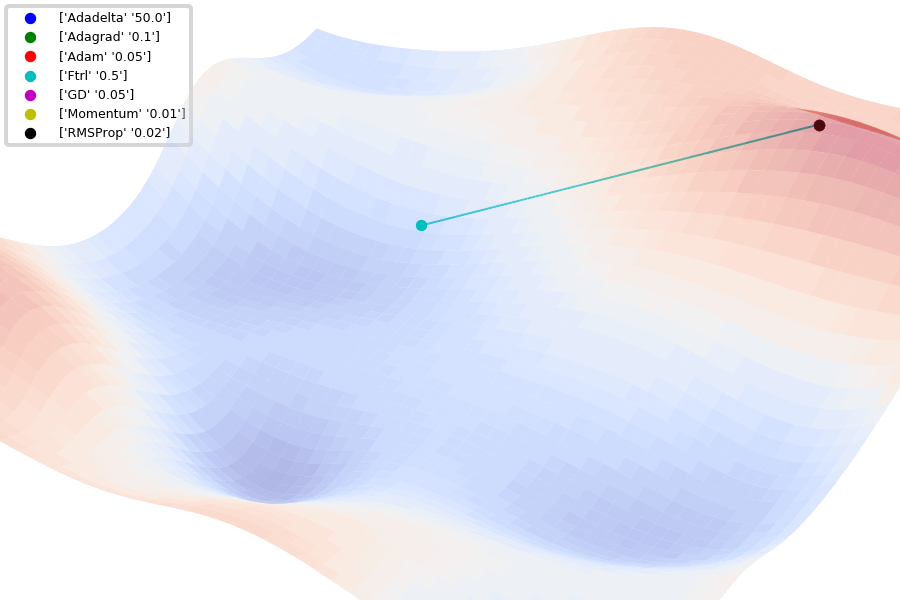

In [7]:
display(HTML(images_html[-1]))


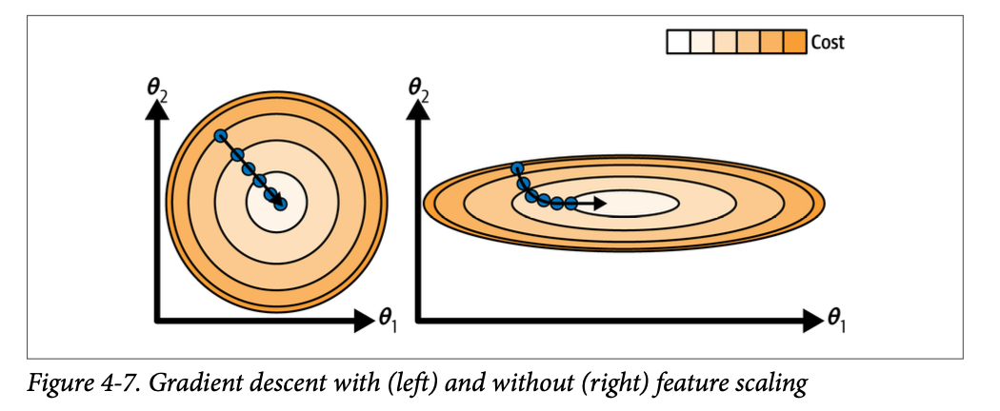

In [10]:
display(HTML(images_html[1]))


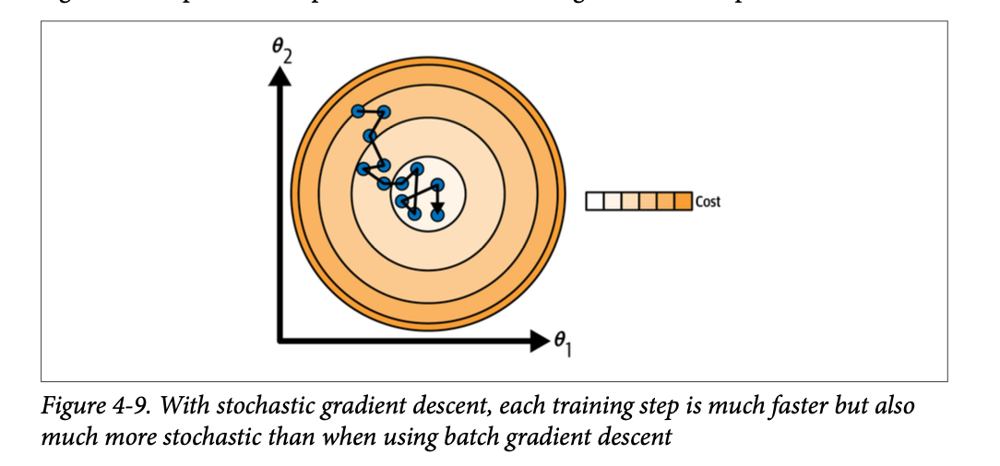

In [11]:
display(HTML(images_html[0]))


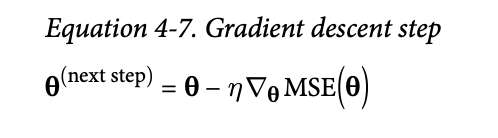

In [12]:
display(HTML(images_html[2]))


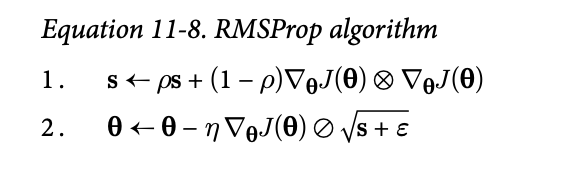

In [13]:
display(HTML(images_html[3]))


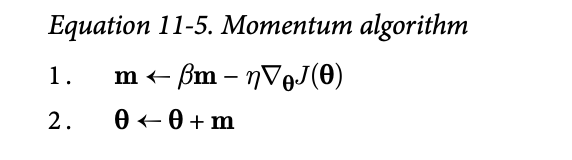

In [17]:
display(HTML(images_html[5]))


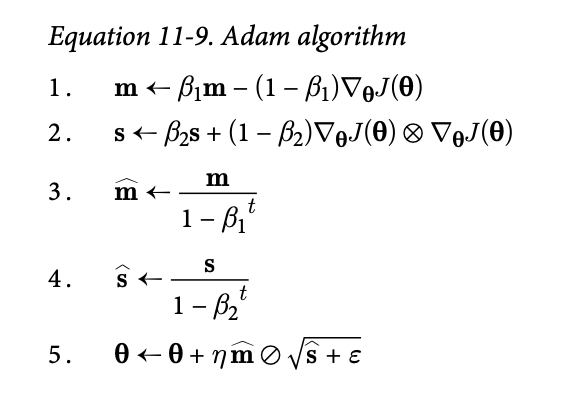

In [14]:
display(HTML(images_html[4]))


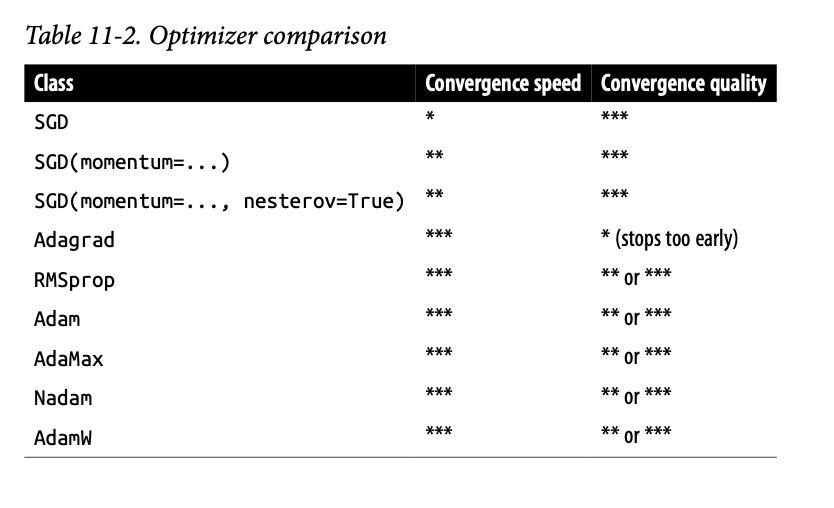

In [18]:
display(HTML(images_html[6]))


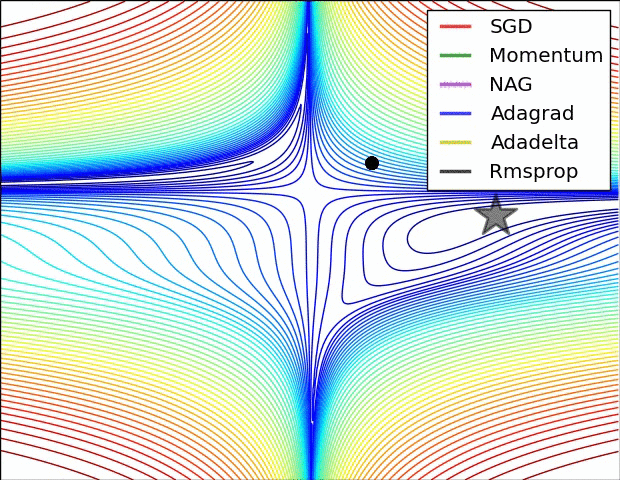

In [21]:
display(HTML(images_html[-2]))


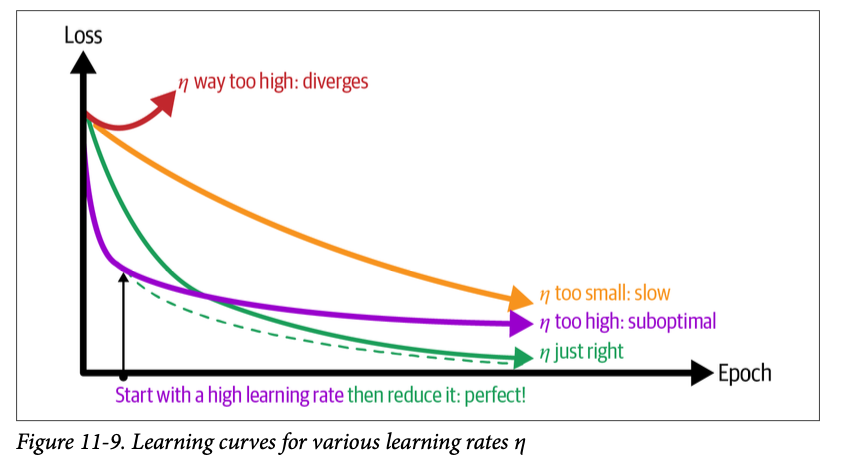

In [19]:
display(HTML(images_html[7]))

## Loading MNIST dataset

In [2]:
mnist = tf.keras.datasets.mnist.load_data()
(X_train_full, y_train_full), (X_test, y_test) = mnist
y_train_full = y_train_full.reshape(-1,1)
y_test = y_test.reshape(-1,1)

In [3]:
print("Shape of x_train_full: ",X_train_full.shape)
print("Shape of y_train_full: ",y_train_full.shape)
print("Shape of x_test:",X_test.shape)
print("Shape of y_test:",y_test.shape)

Shape of x_train_full:  (60000, 28, 28)
Shape of y_train_full:  (60000, 1)
Shape of x_test: (10000, 28, 28)
Shape of y_test: (10000, 1)


## Normalization of data and Validation split

In [4]:
X_train_full = X_train_full.astype("float32") / 255.0
X_test = X_test.astype("float32") / 255.0

In [5]:
X_train, X_valid, y_train, y_valid = train_test_split(X_train_full, y_train_full, random_state=42, test_size=0.2, stratify=y_train_full)

In [6]:
X_train, y_train = tf.convert_to_tensor(X_train) , tf.convert_to_tensor(y_train)
X_valid, y_valid = tf.convert_to_tensor(X_valid) , tf.convert_to_tensor(y_valid)
X_test, y_test = tf.convert_to_tensor(X_test) , tf.convert_to_tensor(y_test)

In [7]:
print("Shape of x_train_full: ",X_train_full.shape)
print("Shape of y_train_full: ",y_train_full.shape)
print("Shape of x_valid:",X_valid.shape)
print("Shape of y_valid:",y_valid.shape)
print("Shape of x_test:",X_test.shape)
print("Shape of y_test:",y_test.shape)

Shape of x_train_full:  (60000, 28, 28)
Shape of y_train_full:  (60000, 1)
Shape of x_valid: (12000, 28, 28)
Shape of y_valid: (12000, 1)
Shape of x_test: (10000, 28, 28)
Shape of y_test: (10000, 1)


# Model builder and utility functions

In [8]:
def model_builder():
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=[28, 28]),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(200, kernel_initializer="he_normal", use_bias=False),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Activation("relu"),
        tf.keras.layers.Dropout(rate=0.2),
        tf.keras.layers.Dense(50, kernel_initializer="he_normal", use_bias=False),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Activation("relu"),
        tf.keras.layers.Dropout(rate=0.2),
        tf.keras.layers.Dense(10, activation="softmax")
    ])
    return model

In [9]:
model_builder().summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 784)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 200)            │       156,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 200)            │           800 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 200)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 50)             │        10,000 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 50)             │           200 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 50)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 10)             │           510 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 168,310 (657.46 KB)

 Trainable params: 167,810 (655.51 KB)

 Non-trainable params: 500 (1.95 KB)

In [10]:
batch_size = 32
n_epochs = 50
n_steps = n_epochs * math.ceil(len(X_train) / batch_size)

exp_lr = lambda inilr : tf.keras.optimizers.schedules.ExponentialDecay(initial_learning_rate=inilr, decay_steps=n_steps, decay_rate=0.1)

optimizers_map = {
    "SGD":tf.keras.optimizers.SGD(learning_rate=exp_lr(0.1)),
    "RMSprop":tf.keras.optimizers.RMSprop(learning_rate=exp_lr(0.001), rho=0.9),
    "Adam":tf.keras.optimizers.Adam(learning_rate=exp_lr(0.001), beta_1=0.9, beta_2=0.999)
}

In [11]:
def plot_history(hist,name):
    df = pd.DataFrame(hist.history)
    plt.figure(figsize=(13, 5))
    #plt.plot(df.index, df["loss"], "r--", label="Training Loss")
    #plt.plot(df.index, df["val_loss"], "r--.", label="Validation Loss")
    plt.plot(df.index, df["accuracy"], "b-", label="Training Accuracy")
    plt.plot(df.index, df["val_accuracy"], "b-*", label="Validation Accuracy")
    # plt.xlim([0, 50])
    # plt.ylim([0, 3])
    plt.xlabel("Epoch")
    plt.ylabel("Metric Value")
    plt.title("Training and Validation Metrics -- "+name)
    plt.grid(True)
    plt.legend()
    plt.tight_layout()

## Training

In [12]:
model_histories = dict()
test_evaluations = dict()
for key in optimizers_map.keys():
    print("-"*50+"TRAINING {}".format(key)+"-"*50)
    model = model_builder()
    model.compile(loss="sparse_categorical_crossentropy", optimizer=optimizers_map[key], metrics=["accuracy"])
    history = model.fit(X_train, y_train, epochs=n_epochs, validation_data=(X_valid, y_valid))
    model_histories[key] = history
    test_evaluations[key] = model.evaluate(X_test, y_test)

--------------------------------------------------TRAINING SGD--------------------------------------------------
Epoch 1/50
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 2s 956us/step - accuracy: 0.8320 - loss: 0.5648 - val_accuracy: 0.9580 - val_loss: 0.1447
Epoch 2/50
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 863us/step - accuracy: 0.9316 - loss: 0.2287 - val_accuracy: 0.9663 - val_loss: 0.1155
Epoch 3/50
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 861us/step - accuracy: 0.9464 - loss: 0.1735 - val_accuracy: 0.9696 - val_loss: 0.1011
Epoch 4/50
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 868us/step - accuracy: 0.9551 - loss: 0.1449 - val_accuracy: 0.9735 - val_loss: 0.0911
Epoch 5/50
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 870us/step - accuracy: 0.9597 - loss: 0.1264 - val_accuracy: 0.9767 - val_loss: 0.0849
Epoch 6/50
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 857us/step - accuracy: 0.9662 - loss: 0.1111 - val_accuracy: 0.9759 - val_loss: 0.0826
Epoch 7/50
1500/1500 ━━━━━━━━━━━━━━━━━━━━ 1s 856us/step - accuracy: 0.9690 - loss: 0.0998 - val

# Results

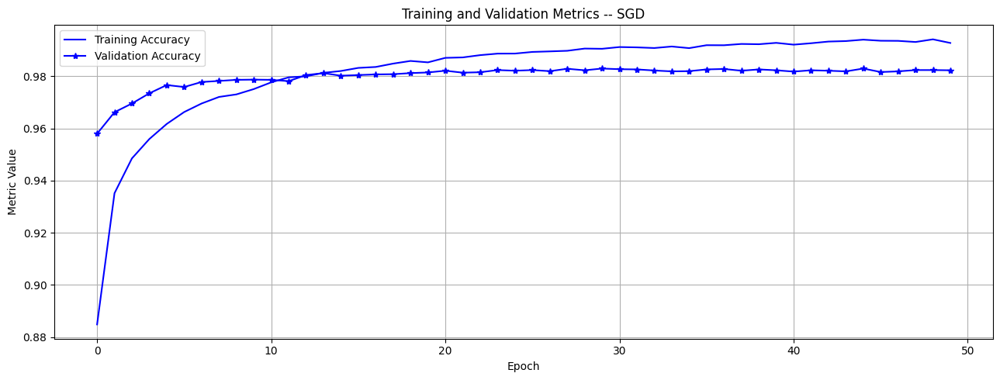

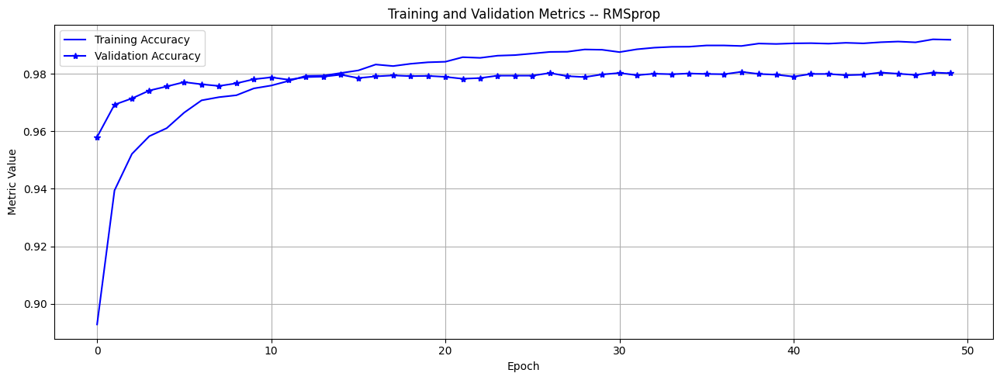

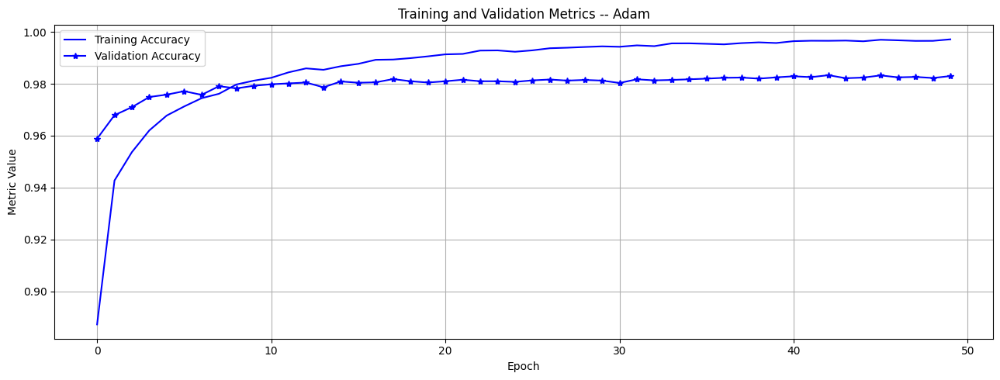

In [13]:
for key in optimizers_map.keys():
    plot_history(model_histories[key],key)

In [14]:
for key in optimizers_map.keys():
    print("{} > Accuracy : {}".format(key, test_evaluations[key][1]))

SGD > Accuracy : 0.9807000160217285
RMSprop > Accuracy : 0.9805999994277954
Adam > Accuracy : 0.9817000031471252
